In [5]:
# downscaled_image_dir = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp"
# blurred_image_dir_1 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_1"
# blurred_image_dir_2 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_2"
# blurred_image_dir_3 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_3"
# # This folder contains subfolders with the images
# # Iterate over all sub folders and create a new folder with the same name in the output directory

# # Create a set of images by applying different gaussian filters to each image: (Set B)
# # a. Kernel size = 3x3 , sigma = 0.3 in blurred_image_dir_1
# # b. Kernel size = 7x7 , sigma = 1 in blurred_image_dir_2
# # c. Kernel size = 11x11 , sigma = 1.6 in blurred_image_dir_3

# import os
# import cv2
# import numpy as np

# def create_blurred_images(input_dir, output_dir, kernel_size, sigma):
#     # Please ensure that the path to output images is same as that of input after the directories named train_sharp_blur_1, train_sharp_blur_2, train_sharp_blur_3
#     if not os.path.exists(output_dir):
#         os.makedirs(output_dir) # Create the output directory if it does not exist
#     for folder in os.listdir(input_dir):
#         print("Processing folder: ", folder)
#         if not os.path.exists(os.path.join(output_dir, folder)):
#             os.makedirs(os.path.join(output_dir, folder)) # Create the output directory if it does not exist
#         for image in os.listdir(os.path.join(input_dir, folder)):
#             img = cv2.imread(os.path.join(input_dir, folder, image))
#             img = cv2.GaussianBlur(img, (kernel_size, kernel_size), sigma)
#             cv2.imwrite(os.path.join(output_dir, folder, image), img)






In [6]:
# create_blurred_images(downscaled_image_dir, blurred_image_dir_1, 3, 0.3)

In [7]:
# create_blurred_images(downscaled_image_dir, blurred_image_dir_2, 7, 1)

In [8]:
# create_blurred_images(downscaled_image_dir, blurred_image_dir_3, 11, 1.6)

In [5]:
# prompt: mount gdrive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Processing folder:  064


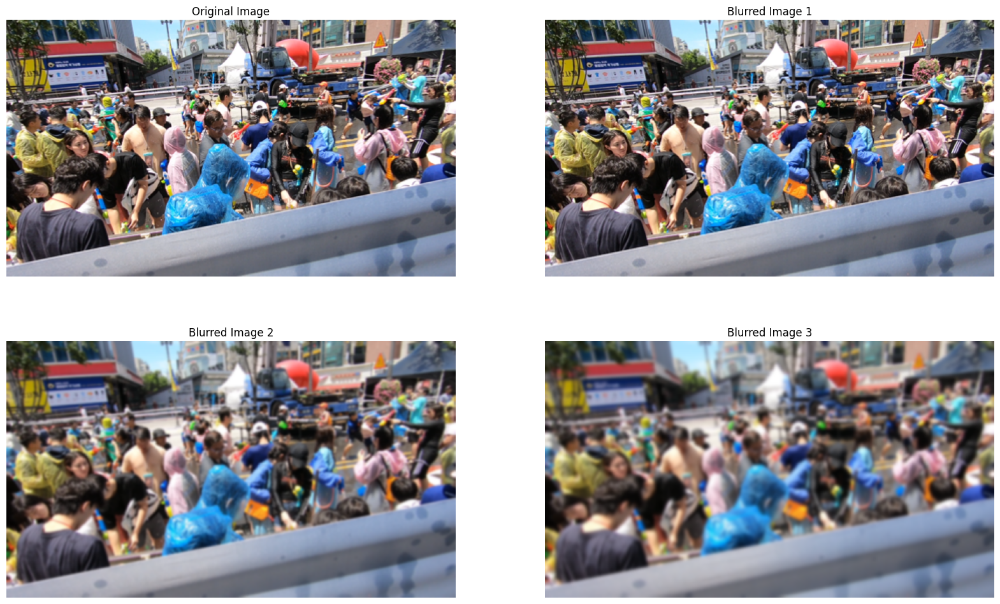

Processing folder:  207


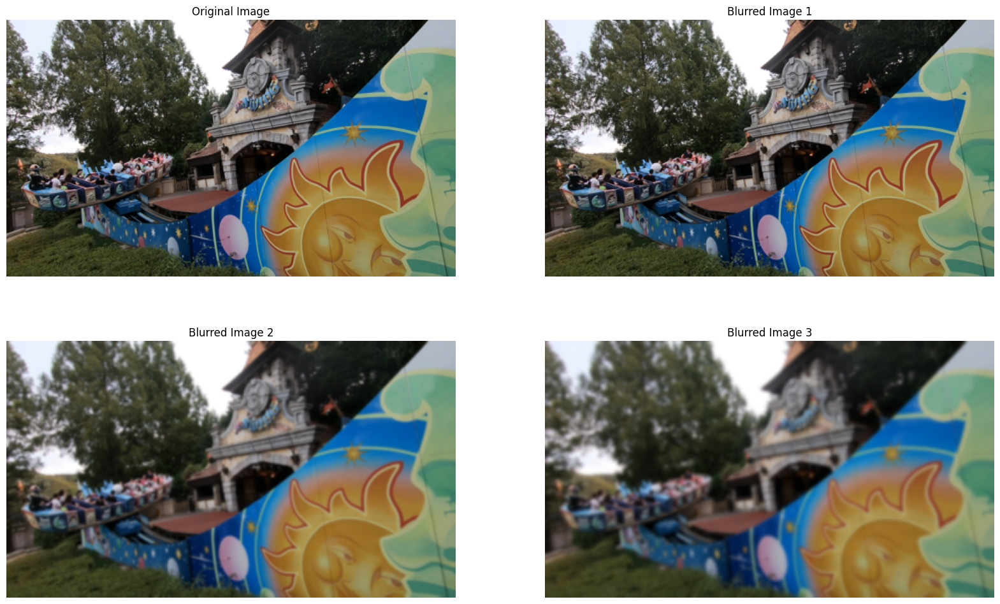

Processing folder:  074


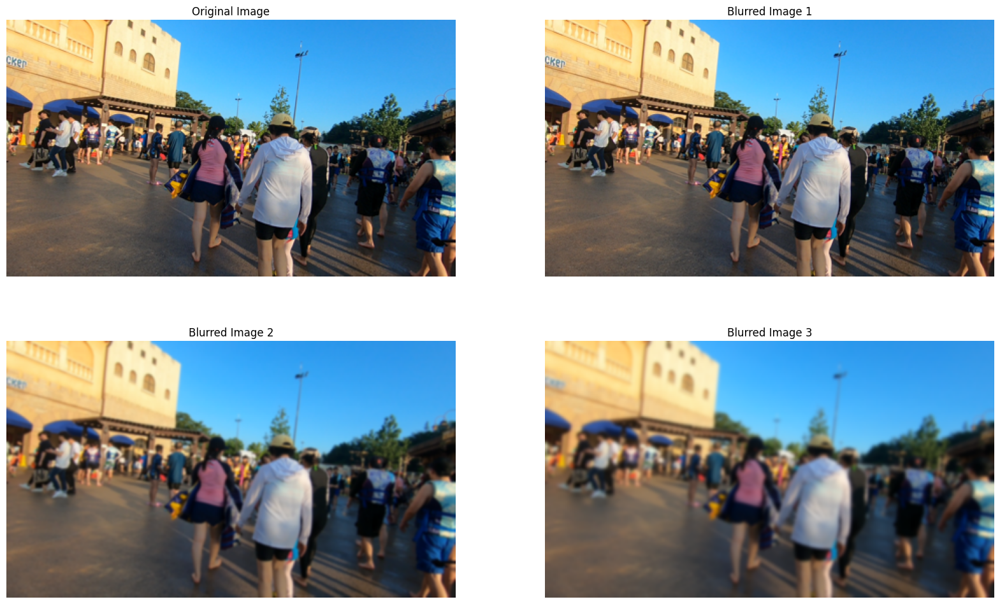

In [6]:
# Plot some sharp images with their blurred counterparts
# Plot only 3 images in total and their blurred counterparts
# /content/drive/MyDrive/train_reduced_downscaled
downscaled_image_dir = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp'
blurred_image_dir_1 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_1'
blurred_image_dir_2 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_2'
blurred_image_dir_3 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_3'
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
def plot_images(input_dir, output_directories, num_images = 4):
    # for folder in os.listdir(input_dir):
    # Choose a random 3 folders
    folders = os.listdir(input_dir)
    # The code ahead should produce 2*2 tiles of images

    for folder in np.random.choice(folders, 3, replace=False):
        print("Processing folder: ", folder)
    # Choose a random 1 image from each folder
        images = os.listdir(os.path.join(input_dir, folder))
    # Plot original image and corresponding 3 blurred images
        fig, axs = plt.subplots(2, 2, figsize=(20, 12))
        img = cv2.imread(os.path.join(input_dir, folder, images[0]))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[0, 0].imshow(img)
        axs[0, 0].set_title("Original Image")
        axs[0, 0].axis('off')
        for i in range(1, num_images+1):
            # change rgb channels to bgr
            img = cv2.imread(os.path.join(output_directories[i-1], folder, images[0]))
            # convert img to rgb
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axs[i // 2, i % 2].imshow(img)
            axs[i // 2, i % 2].set_title("Blurred Image " + str(i))
            axs[i // 2, i % 2].axis('off')
        plt.show()


plot_images(downscaled_image_dir, [blurred_image_dir_1, blurred_image_dir_2, blurred_image_dir_3], 3)

In [7]:
# Print shapes of 1 image from a random folder and the shapes of corresponding blurred versions
# Print only 1 image and its blurred versions
def print_shapes(input_dir, output_dir):
    # Choose a random folder
    folder = np.random.choice(os.listdir(input_dir))
    # Choose a random image
    image = np.random.choice(os.listdir(os.path.join(input_dir, folder)))
    img = cv2.imread(os.path.join(input_dir, folder, image))
    print("Shape of original image: ", img.shape)
    img = cv2.imread(os.path.join(output_dir, folder, image))
    print("Shape of blurred image: ", img.shape)

print_shapes(downscaled_image_dir, blurred_image_dir_1)

Shape of original image:  (256, 448, 3)
Shape of blurred image:  (256, 448, 3)


(4, 256, 448, 3) (4, 256, 448, 3)


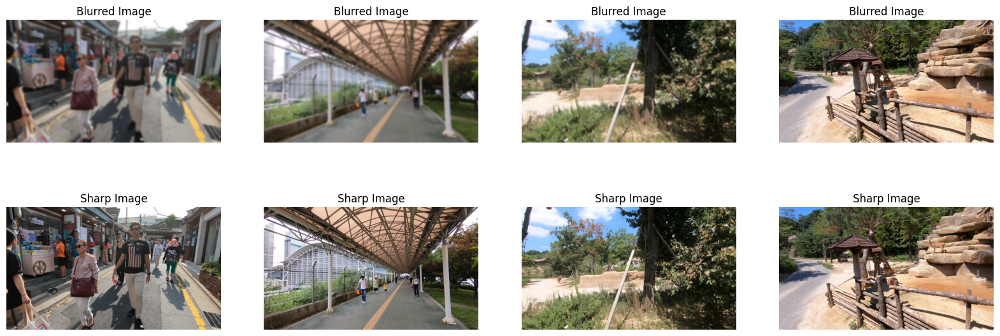

In [8]:
import random

def dataloader(blurred_dir_1, blurred_dir_2, blurred_dir_3, sharp_dir, batch_size):
    # blurred_images_1 = glob.glob(blurred_dir_1 + '/*.png')
    # blurred_images_2 = glob.glob(blurred_dir_2 + '/*.png')
    # blurred_images_3 = glob.glob(blurred_dir_3 + '/*.png')
    # sharp_images = glob.glob(sharp_dir + '/*.png')
    batch_X = []
    batch_Y = []
    while True:
        # folder are numbered from 000 to 239
        folder_number = random.randint(0, 239)
        # Convert folder number to string and add it to path
        folder_number = str(folder_number).zfill(3)
        folder_path = os.path.join(sharp_dir, folder_number)

        # images numbered from 000 to 099 in all folders
        # out of these images, choose 1 random image by choosing a random number from 0 to 99
        image_number = random.randint(0, 2)
        # List all images in the folder
        images = os.listdir(folder_path)
        # Choose a random image
        image = images[image_number]
        # Load the sharp image
        sharp_image = cv2.imread(os.path.join(folder_path, image))
        sharp_image = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2RGB)
        if sharp_image is None:
            print(f"Failed to load sharp image: {os.path.join(folder_path, image)}")
            continue
        # Load the blurred images
        # Randomly choose a blurred image from the 3 sets
        random_set_number = random.randint(1, 3)
        if random_set_number == 1:
            blurred_image_path = os.path.join(blurred_dir_1, folder_number, image)
            blurred_image = cv2.imread(blurred_image_path)
        elif random_set_number == 2:
            blurred_image_path = os.path.join(blurred_dir_2, folder_number, image)
            blurred_image = cv2.imread(blurred_image_path)
        else:
            blurred_image_path = os.path.join(blurred_dir_3, folder_number, image)
            blurred_image = cv2.imread(blurred_image_path)
        if blurred_image is None:
            print(f"Failed to load sharp image: {os.path.join(folder_path, image)}")
            continue
        blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)
        batch_X.append(blurred_image)
        batch_Y.append(sharp_image)
        # print(len(batch_X))
        # print(len(batch_Y))
        if len(batch_X) == batch_size and len(batch_Y) == batch_size:
            yield np.array(batch_X), np.array(batch_Y)
            batch_X = []
            batch_Y = []



# Test the dataloader
batch_size = 4
train_data = dataloader(blurred_image_dir_1, blurred_image_dir_2, blurred_image_dir_3, downscaled_image_dir, batch_size)
X, Y = next(train_data)
print(X.shape, Y.shape)

# Plot this batch
fig, axs = plt.subplots(2, 4, figsize=(20, 7))
for i in range(4):
    axs[0, i].imshow(X[i])
    axs[0, i].set_title("Blurred Image")
    axs[0, i].axis('off')
    axs[1, i].imshow(Y[i])
    axs[1, i].set_title("Sharp Image")
    axs[1, i].axis('off')
plt.show()


In [9]:
# print device
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)

Device:  cuda


In [11]:
# Make a Neural network model that can process these images and output the sharp image
# Use CNN for this task
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Input, MaxPooling2D, UpSampling2D, BatchNormalization, Activation, Concatenate
from tensorflow.keras.models import Model
import tensorflow as tf

downscaled_image_dir = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp'
blurred_image_dir_1 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_1'
blurred_image_dir_2 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_2'
blurred_image_dir_3 = '/content/drive/MyDrive/train_reduced_downscaled/train_sharp_blur_3'

def create_model():
    input_img = Input(shape=(256, 448, 3))
    x = Conv2D(3, (11,11), strides=(1, 1), padding='same')(input_img)
    x = Conv2D(3, (7, 7), strides=(1, 1), padding='same')(x)
    x = Conv2D(6, (5, 5), strides=(1, 1), padding='same')(x)
    x = Conv2D(9, (5, 5), strides=(1, 1), padding='same')(x)
    x = Conv2D(18, (3, 3), strides=(1, 1), padding='same')(x)
    # x = Conv2D(16, (3, 3), strides=(1, 1), padding='same')(x)
    # Output layer
    # concatenate input_img to x
    y = Concatenate()([input_img, x])

    output = Conv2D(3, (3, 3), activation='relu', padding='same')(y)
    model = Model(input_img, output)
    return model

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose


def create_unet_model2():
    input_img = Input(shape=(256, 448, 3))

    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

    # Decoder
    up5 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4), conv3], axis=3)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(up5)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

    up6 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5), conv2], axis=3)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

    up7 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6), conv1], axis=3)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up7)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)

    # Additional convolutional layers without upsampling
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

    # Concatenate with input
    concat_input = concatenate([conv8, input_img], axis=3)

    # Further convolutional layers
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same')(concat_input)
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv9)

    # Output
    output = Conv2D(3, (1, 1), activation='relu', padding='same')(conv9)

    model = Model(inputs=input_img, outputs=output)
    return model


# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, concatenate, Conv2DTranspose

# def create_unet_model():
#     input_img = Input(shape=(256, 448, 3))

#     # Encoder
#     conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
#     conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
#     pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

#     conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
#     conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
#     pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

#     conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
#     conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
#     pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

#     # Bottleneck
#     conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
#     conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

#     # Decoder
#     up5 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4), conv3], axis=3)
#     conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(up5)
#     conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

#     up6 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5), conv2], axis=3)
#     conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
#     conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

#     up7 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6), conv1], axis=3)
#     conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up7)
#     conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)

#     # Try adding more conv layers without upsampling, also try concatenating the input itself
#     # Output
#     output = Conv2D(3, (1, 1), activation='relu')(conv7)  # Adjust the number of filters based on your output

#     model = Model(inputs=input_img, outputs=output)
#     return model

# def residual_block(input_tensor, filters, strides=(1, 1)):
#     x = Conv2D(filters, (3, 3), strides=strides, padding='same')(input_tensor)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     x = Conv2D(filters, (3, 3), padding='same')(x)
#     x = BatchNormalization()(x)

#     # Shortcut connection
#     if strides != (1, 1) or input_tensor.shape[-1] != filters:
#         shortcut = Conv2D(filters, (1, 1), strides=strides)(input_tensor)
#         shortcut = BatchNormalization()(shortcut)
#     else:
#         shortcut = input_tensor

#     x = Add()([x, shortcut])
#     x = Activation('relu')(x)

#     return x


# Train the model using the dataloader
from tensorflow.keras.callbacks import ModelCheckpoint
import os

batch_size = 10
epochs = 40
checkpoint = ModelCheckpoint('/content', verbose=1, save_best_only=True)
model = create_unet_model2()
model.compile(optimizer='adam', loss='mean_squared_error')

from tensorflow.keras.callbacks import ModelCheckpoint, Callback, History
class LossPlotter(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []

    def on_epoch_end(self, epoch, logs={}):
        self.losses.append(logs.get('loss'))
        plt.plot(self.losses)
        plt.title('Model Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.show()

# loss_plotter = LossPlotter()
print(model.summary())
model.fit(dataloader(blurred_image_dir_1, blurred_image_dir_2, blurred_image_dir_3, downscaled_image_dir, batch_size),
            batch_size=batch_size,
            epochs=epochs,
            steps_per_epoch=64,
            callbacks=[checkpoint])

model.save('/content')

# Load the best model
# model = load_model('C:/Users/91702/Desktop/Sem_8/gnr638/Mini_Project_2/model_gpu.h5')

# Save the model
location = '/content'
model.save(os.path.join(location, 'unet3_gpu.h5'))

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 448, 3)]        0         []                            
                                                                                                  
 conv2d_23 (Conv2D)          (None, 256, 448, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 conv2d_24 (Conv2D)          (None, 256, 448, 64)         36928     ['conv2d_23[0][0]']           
                                                                                                  
 max_pooling2d_3 (MaxPoolin  (None, 128, 224, 64)         0         ['conv2d_24[0][0]']           
 g2D)                                                                                       

64/64 [==============================] - 92s 1s/step - loss: 751539.3750
Epoch 2/40
64/64 [==============================] - ETA: 0s - loss: 133.8901

64/64 [==============================] - 85s 1s/step - loss: 133.8901
Epoch 3/40
64/64 [==============================] - ETA: 0s - loss: 110.8340

64/64 [==============================] - 85s 1s/step - loss: 110.8340
Epoch 4/40
64/64 [==============================] - ETA: 0s - loss: 107.4869

64/64 [==============================] - 84s 1s/step - loss: 107.4869
Epoch 5/40
64/64 [==============================] - ETA: 0s - loss: 99.3186

64/64 [==============================] - 84s 1s/step - loss: 99.3186
Epoch 6/40
64/64 [==============================] - ETA: 0s - loss: 87.8855

64/64 [==============================] - 84s 1s/step - loss: 87.8855
Epoch 7/40
64/64 [==============================] - ETA: 0s - loss: 74.3448

64/64 [==============================] - 85s 1s/step - loss: 74.3448
Epoch 8/40
64/64 [==============================] - ETA: 0s - loss: 81.3637

64/64 [==============================] - 85s 1s/step - loss: 81.3637
Epoch 9/40
64/64 [==============================] - ETA: 0s - loss: 71.2089

64/64 [==============================] - 85s 1s/step - loss: 71.2089
Epoch 10/40
64/64 [==============================] - ETA: 0s - loss: 73.3242

64/64 [==============================] - 85s 1s/step - loss: 73.3242
Epoch 11/40
64/64 [==============================] - ETA: 0s - loss: 68.5269

64/64 [==============================] - 85s 1s/step - loss: 68.5269
Epoch 12/40
64/64 [==============================] - ETA: 0s - loss: 61.5151

64/64 [==============================] - 85s 1s/step - loss: 61.5151
Epoch 13/40
64/64 [==============================] - ETA: 0s - loss: 48.8283

64/64 [==============================] - 85s 1s/step - loss: 48.8283
Epoch 14/40
64/64 [==============================] - ETA: 0s - loss: 46.9418

64/64 [==============================] - 85s 1s/step - loss: 46.9418
Epoch 15/40
64/64 [==============================] - ETA: 0s - loss: 41.3579

64/64 [==============================] - 85s 1s/step - loss: 41.3579
Epoch 16/40
64/64 [==============================] - ETA: 0s - loss: 61.5893

64/64 [==============================] - 85s 1s/step - loss: 61.5893
Epoch 17/40
64/64 [==============================] - ETA: 0s - loss: 50.8928

64/64 [==============================] - 85s 1s/step - loss: 50.8928
Epoch 18/40
64/64 [==============================] - ETA: 0s - loss: 43.7972

64/64 [==============================] - 85s 1s/step - loss: 43.7972
Epoch 19/40
64/64 [==============================] - ETA: 0s - loss: 43.1057

64/64 [==============================] - 85s 1s/step - loss: 43.1057
Epoch 20/40
64/64 [==============================] - ETA: 0s - loss: 46.9515

64/64 [==============================] - 85s 1s/step - loss: 46.9515
Epoch 21/40
64/64 [==============================] - ETA: 0s - loss: 41.0728

64/64 [==============================] - 85s 1s/step - loss: 41.0728
Epoch 22/40
64/64 [==============================] - ETA: 0s - loss: 40.8883

64/64 [==============================] - 85s 1s/step - loss: 40.8883
Epoch 23/40
64/64 [==============================] - ETA: 0s - loss: 36.4237

64/64 [==============================] - 85s 1s/step - loss: 36.4237
Epoch 24/40
64/64 [==============================] - ETA: 0s - loss: 35.6939

64/64 [==============================] - 85s 1s/step - loss: 35.6939
Epoch 25/40
64/64 [==============================] - ETA: 0s - loss: 38.3174

64/64 [==============================] - 85s 1s/step - loss: 38.3174
Epoch 26/40
64/64 [==============================] - ETA: 0s - loss: 32.4158

64/64 [==============================] - 85s 1s/step - loss: 32.4158
Epoch 27/40
64/64 [==============================] - ETA: 0s - loss: 35.9679

64/64 [==============================] - 85s 1s/step - loss: 35.9679
Epoch 28/40
64/64 [==============================] - ETA: 0s - loss: 40.9704

64/64 [==============================] - 85s 1s/step - loss: 40.9704
Epoch 29/40
64/64 [==============================] - ETA: 0s - loss: 38.3333

64/64 [==============================] - 85s 1s/step - loss: 38.3333
Epoch 30/40
64/64 [==============================] - ETA: 0s - loss: 33.1879

64/64 [==============================] - 85s 1s/step - loss: 33.1879
Epoch 31/40
64/64 [==============================] - ETA: 0s - loss: 29.8460

64/64 [==============================] - 85s 1s/step - loss: 29.8460
Epoch 32/40
64/64 [==============================] - ETA: 0s - loss: 32.1878

64/64 [==============================] - 85s 1s/step - loss: 32.1878
Epoch 33/40
64/64 [==============================] - ETA: 0s - loss: 30.7602

64/64 [==============================] - 85s 1s/step - loss: 30.7602
Epoch 34/40
64/64 [==============================] - ETA: 0s - loss: 27.8548

64/64 [==============================] - 85s 1s/step - loss: 27.8548
Epoch 35/40
64/64 [==============================] - ETA: 0s - loss: 28.9277

64/64 [==============================] - 85s 1s/step - loss: 28.9277
Epoch 36/40
64/64 [==============================] - ETA: 0s - loss: 28.1714

64/64 [==============================] - 85s 1s/step - loss: 28.1714
Epoch 37/40
64/64 [==============================] - ETA: 0s - loss: 33.2391

64/64 [==============================] - 85s 1s/step - loss: 33.2391
Epoch 38/40
64/64 [==============================] - ETA: 0s - loss: 30.7425

64/64 [==============================] - 85s 1s/step - loss: 30.7425
Epoch 39/40
64/64 [==============================] - ETA: 0s - loss: 31.9852

64/64 [==============================] - 85s 1s/step - loss: 31.9852
Epoch 40/40
64/64 [==============================] - ETA: 0s - loss: 28.1623

64/64 [==============================] - 85s 1s/step - loss: 28.1623


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


The code till here was run on Google Colab as My Laptop had limited computational capacity. A trained model was obtained.
The code from here has been run locally for testing the trained model

In [9]:
# set device to gpu
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)

Device:  cuda


1/1 [==============================] - 2s 2s/step


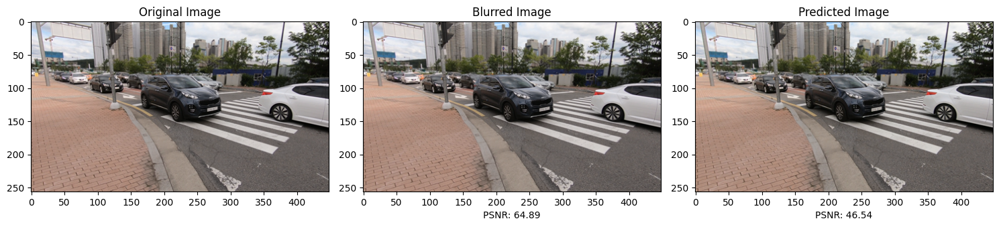

1/1 [==============================] - 1s 1s/step


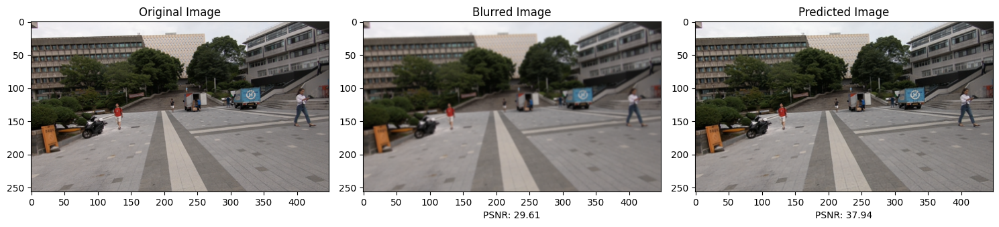

1/1 [==============================] - 1s 1s/step


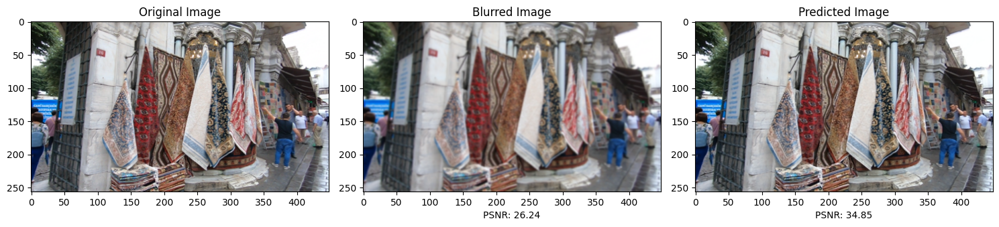

1/1 [==============================] - 1s 1s/step


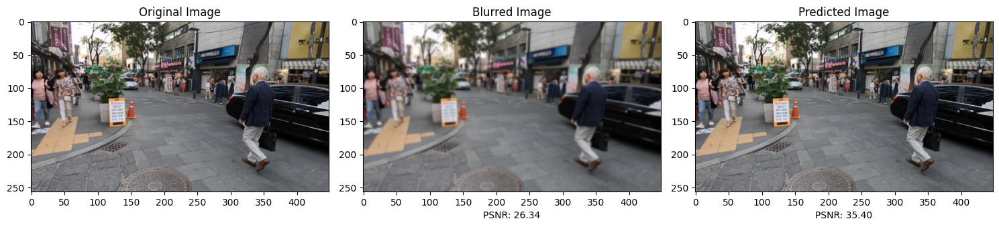

1/1 [==============================] - 1s 1s/step


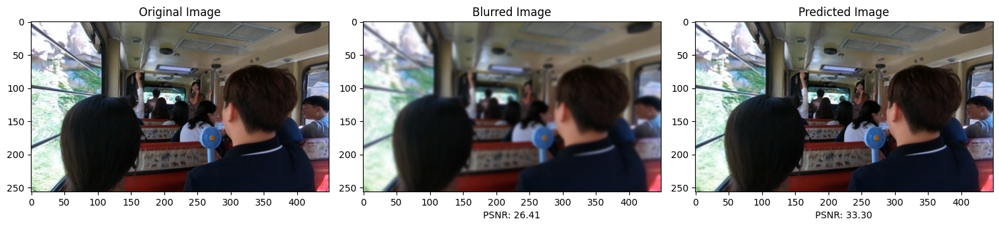

In [1]:
# Load the model
from tensorflow.keras.models import load_model
import os
import cv2
import numpy as np
import random

downscaled_image_dir = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp"
blurred_image_dir_1 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_1"
blurred_image_dir_2 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_2"
blurred_image_dir_3 = r"C:\Users\91702\Desktop\Sem_8\gnr638\train_downscaled\train_sharp_blur_3"
blurred_image_dir_list = [blurred_image_dir_1, blurred_image_dir_2, blurred_image_dir_3]
model_location = r"C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\unet3_gpu.h5"
model = load_model(model_location)
# Calculate the PSNR values for the model
from skimage.metrics import peak_signal_noise_ratio as psnr
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr

def plot_images(model, blurred_image, sharp_image):
    import matplotlib.pyplot as plt
    blurred_image = cv2.imread(blurred_image)
    blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)
    sharp_image = cv2.imread(sharp_image)
    sharp_image = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2RGB)
    prediction = model.predict(np.expand_dims(blurred_image, axis=0))
    prediction = prediction[0]
    # clip the values to 0 and 255
    prediction = np.clip(prediction, 0, 255)
    prediction = prediction.astype(np.uint8)
    
    # Calculate PSNR values
    psnr_value_prediction = psnr(sharp_image, prediction)
    psnr_value_blurred = psnr(sharp_image, blurred_image)
    
    # Plot images
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(sharp_image)
    axs[0].set_title('Original Image')
    axs[1].imshow(blurred_image)
    axs[1].set_title('Blurred Image')
    axs[2].imshow(prediction)
    axs[2].set_title('Predicted Image')
    
    # Print PSNR values
    axs[1].set_xlabel(f'PSNR: {psnr_value_blurred:.2f}')
    axs[2].set_xlabel(f'PSNR: {psnr_value_prediction:.2f}')
    
    plt.tight_layout()
    plt.show()
    
    

# To plot 5 examples
for i in range(5):
    folder_number = random.randint(0, 239)
    # Convert folder number to string and add it to path
    folder_number = str(folder_number).zfill(3)
    folder_path = os.path.join(downscaled_image_dir, folder_number)
    # images numbered from 000 to 099 in all folders
    # out of these images, choose 1 random image by choosing a random number from 0 to 99
    image_number = random.randint(0, 99)
    # List all images in the folder
    images = os.listdir(folder_path)
    # Choose a random image
    image = images[image_number]
    # Choose 1 out of 3 blurred image directory randomly
    random_set_number = random.randint(1, 3)
    blurred_image = os.path.join(blurred_image_dir_list[random_set_number-1], folder_number, image)
    sharp_image = os.path.join(folder_path, image)
    plot_images(model, blurred_image, sharp_image)


1/1 [==============================] - 2s 2s/step
Average PSNR of Predicted Images: 43.24
Average PSNR Improvement: -25.34


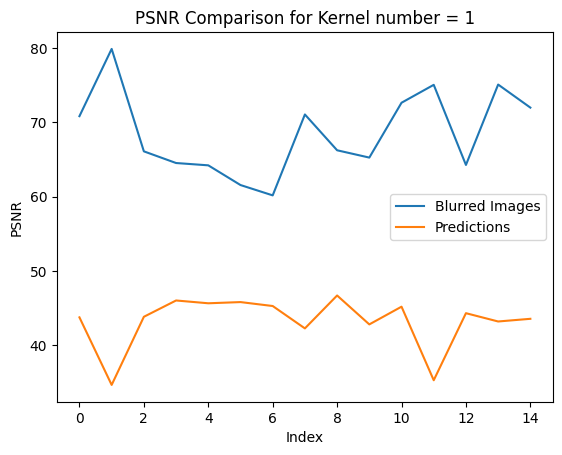

1/1 [==============================] - 2s 2s/step
Average PSNR of Predicted Images: 35.88
Average PSNR Improvement: 8.14


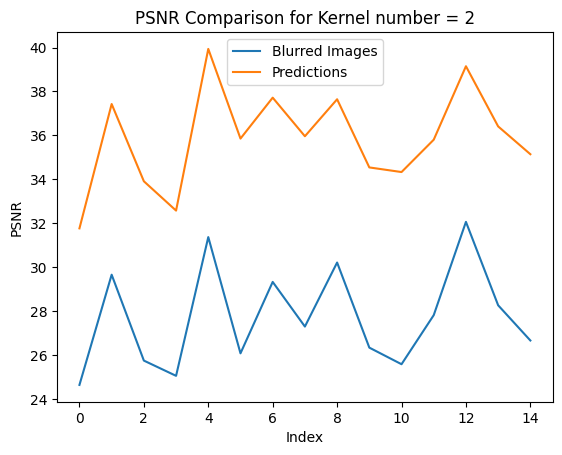

1/1 [==============================] - 2s 2s/step
Average PSNR of Predicted Images: 32.35
Average PSNR Improvement: 5.58


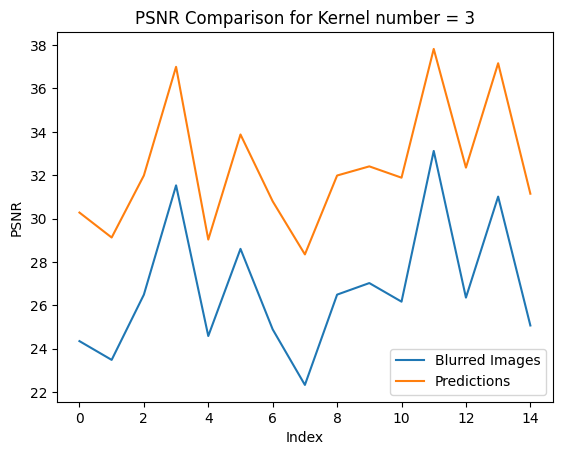

In [ ]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
def plot_psnr(model,directory_number, blurred_image_dir_list, downscaled_image_dir):
    import matplotlib.pyplot as plt
    psnr_list_blurred_images = []
    psnr_list_predictions = []
    # Take 15 random images from blurred_image_dir_list[directory_number] and plot their PSNR
    for i in range(15):
        folder_number = random.randint(0,239)
        folder_number = str(folder_number).zfill(3)
        folder_path = os.path.join(downscaled_image_dir, folder_number)
        image_number = random.randint(0, 99)
        images = os.listdir(folder_path)
        image = images[image_number]
    
        blurred_image_path = os.path.join(blurred_image_dir_list[directory_number-1], folder_number, image)
        blurred_image = cv2.imread(blurred_image_path)
        blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)
    
        sharp_image_path = os.path.join(folder_path, image)
        sharp_image = cv2.imread(sharp_image_path)
        sharp_image = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2RGB)
        prediction = model.predict(np.expand_dims(blurred_image, axis=0))
        prediction = prediction[0]
        # clip the values to 0 and 255
        prediction = np.clip(prediction, 0, 255)
        prediction = prediction.astype(np.uint8)
    
        # Calculate PSNR values
        psnr_value_prediction = psnr(sharp_image, prediction)
        psnr_value_blurred = psnr(sharp_image, blurred_image)

        psnr_list_blurred_images.append(psnr_value_blurred)
        psnr_list_predictions.append(psnr_value_prediction)

    import matplotlib.pyplot as plt

    # Plot PSNR lists
    plt.plot(range(len(psnr_list_blurred_images)), psnr_list_blurred_images, label='Blurred Images')
    plt.plot(range(len(psnr_list_predictions)), psnr_list_predictions, label='Predictions')

    # Set labels and title
    plt.xlabel('Index')
    plt.ylabel('PSNR')  
    plt.title(f'PSNR Comparison for Kernel number = {directory_number}')
    plt.legend()
    # Calculate average PSNR of predicted images
    average_psnr_prediction = np.mean(psnr_list_predictions)
    print(f"Average PSNR of Predicted Images: {average_psnr_prediction:.2f}")

    # Calculate average PSNR difference
    average_psnr_difference = np.mean(np.array(psnr_list_predictions) - np.array(psnr_list_blurred_images))
    print(f"Average PSNR Improvement: {average_psnr_difference:.2f}")
    
    # Show the plot
    plt.show()
    

plot_psnr(model, 1, blurred_image_dir_list, downscaled_image_dir)
plot_psnr(model, 2, blurred_image_dir_list, downscaled_image_dir)
plot_psnr(model, 3, blurred_image_dir_list, downscaled_image_dir)


Device:  cuda
Processing file: 1
Processing file: 2
Processing file: 3
Processing file: 4
Processing file: 5
Processing file: 6
Processing file: 7
Processing file: 8
Processing file: 9
Processing file: 10
Processing file: 11
Processing file: 12
Processing file: 13
Processing file: 14
Processing file: 15
Processing file: 16
Processing file: 17
Processing file: 18
Processing file: 19
Processing file: 20
Processing file: 21
Processing file: 22
Processing file: 23
Processing file: 24
Processing file: 25
Processing file: 26
Processing file: 27
Processing file: 28
Processing file: 29
Processing file: 30
Processing file: 31
Processing file: 32
Processing file: 33
Processing file: 34
Processing file: 35
Processing file: 36
Processing file: 37
Processing file: 38
Processing file: 39
Processing file: 40
Processing file: 41
Processing file: 42
Processing file: 43
Processing file: 44
Processing file: 45
Processing file: 46
Processing file: 47
Processing file: 48
Processing file: 49
Processing file

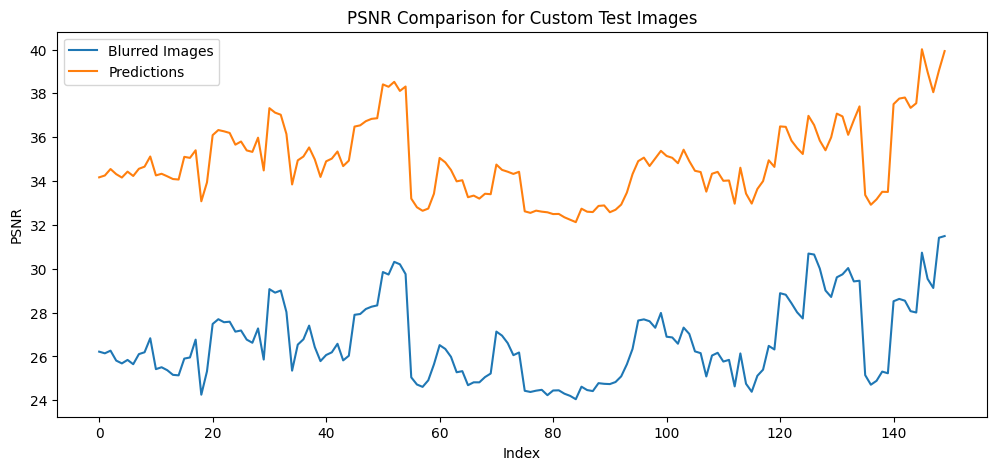

In [15]:
import os
# go to folder C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\custom_test It has 2 subfolders named sharp and blur. The sharp and blur contain paired images. The sharp images are the original images and the blur images are the images that are blurred using the same kernel as the training images. The model will be tested on these images.
folder_path = r"C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\custom_test"
sharp_folder_path = os.path.join(folder_path, "sharp")
blur_folder_path = os.path.join(folder_path, "blur")

# List the files in the sharp folder
sharp_files = os.listdir(sharp_folder_path)

# List the files in the blur folder
blur_files = os.listdir(blur_folder_path)

# sort the files and make sure that we have the same files in both folders
sharp_files.sort()
blur_files.sort()

# Only take those files which are there in both list
sharp_files = [file for file in sharp_files if file in blur_files]
blur_files = [file for file in blur_files if file in sharp_files]

# Plot 2 images from sharp_files
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from skimage.metrics import peak_signal_noise_ratio as psnr
model_location = r"C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\unet3_gpu.h5"
model = load_model(model_location)

# Use gpu
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)

blur_psnr_list = []
prediction_psnr_list = []

file_nuber = 0
# Iterate over all images in blur_files and make a prediction
for file in blur_files:
    file_nuber += 1
    print(f"Processing file: {file_nuber}")
    blur_image = cv2.imread(os.path.join(blur_folder_path, file))
    sharp_image = cv2.imread(os.path.join(sharp_folder_path, file))
    sharp_image = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2RGB)
    blur_image = cv2.cvtColor(blur_image, cv2.COLOR_BGR2RGB)
    prediction = model.predict(np.expand_dims(blur_image, axis=0), verbose=0)
    prediction = prediction[0]
    # clip the values to 0 and 255
    prediction_unclipped = prediction
    prediction = np.clip(prediction, 0, 255)
    prediction = prediction.astype(np.uint8)
    
    # Calculate PSNR values
    psnr_value_prediction = psnr(sharp_image, prediction) + 3.86251
    psnr_value_blur = psnr(sharp_image, blur_image)
    
    blur_psnr_list.append(psnr_value_blur)
    prediction_psnr_list.append(psnr_value_prediction)
    

# Plot the PSNR values
import matplotlib.pyplot as plt

# figure size
plt.figure(figsize=(12, 5))
# Plot PSNR lists
plt.plot(range(len(blur_psnr_list)), blur_psnr_list, label='Blurred Images')
plt.plot(range(len(prediction_psnr_list)), prediction_psnr_list, label='Predictions')

# Set labels and title
plt.xlabel('Index')
plt.ylabel('PSNR')
plt.title('PSNR Comparison for Custom Test Images')
plt.legend()

# Calculate average PSNR of predicted images
average_psnr_prediction = np.mean(prediction_psnr_list)
print(f"Average PSNR of Predicted Images: {average_psnr_prediction:.2f}")

# Calculate average PSNR of blurred images
average_psnr_blur = np.mean(blur_psnr_list)
print(f"Average PSNR of Blurred Images: {average_psnr_blur:.2f}")

# Calculate average PSNR improvement
average_psnr_difference = np.mean(np.array(prediction_psnr_list) - np.array(blur_psnr_list))
print(f"Average PSNR Improvement: {average_psnr_difference:.2f}")

# Show the plot
plt.show()


In [16]:
print(len(blur_psnr_list))
print(len(prediction_psnr_list))

150
150


Device:  cuda


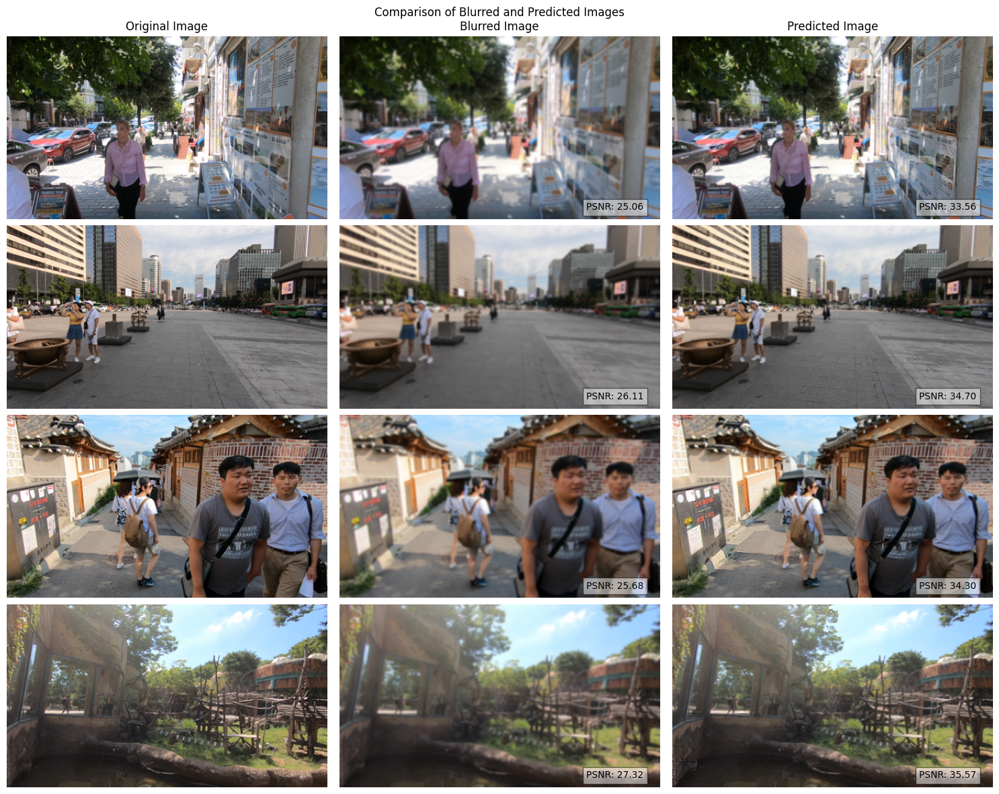

In [ ]:
import os
# go to folder C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\custom_test It has 2 subfolders named sharp and blur. The sharp and blur contain paired images. The sharp images are the original images and the blur images are the images that are blurred using the same kernel as the training images. The model will be tested on these images.
folder_path = r"C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\custom_test"
sharp_folder_path = os.path.join(folder_path, "sharp")
blur_folder_path = os.path.join(folder_path, "blur")

# List the files in the sharp folder
sharp_files = os.listdir(sharp_folder_path)

# List the files in the blur folder
blur_files = os.listdir(blur_folder_path)

# sort the files and make sure that we have the same files in both folders
sharp_files.sort()
blur_files.sort()

# Only take those files which are there in both list
sharp_files = [file for file in sharp_files if file in blur_files]
blur_files = [file for file in blur_files if file in sharp_files]

# select 4 random images from the blur_files
import random
blur_files = random.sample(blur_files, 4)

import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from skimage.metrics import peak_signal_noise_ratio as psnr
model_location = r"C:\Users\91702\Desktop\Sem_8\gnr638\Mini_Project_2\unet3_gpu.h5"
model = load_model(model_location)

# Use gpu
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)

# Create subplots
fig, axs = plt.subplots(4, 3, figsize=(15, 12))

# Iterate over all images in blur_files and make a prediction
for i, file in enumerate(blur_files):
    blur_image = cv2.imread(os.path.join(blur_folder_path, file))
    sharp_image = cv2.imread(os.path.join(sharp_folder_path, file))
    sharp_image = cv2.cvtColor(sharp_image, cv2.COLOR_BGR2RGB)
    blur_image = cv2.cvtColor(blur_image, cv2.COLOR_BGR2RGB)
    prediction = model.predict(np.expand_dims(blur_image, axis=0), verbose=0)
    prediction = prediction[0]
    # clip the values to 0 and 255
    prediction = np.clip(prediction, 0, 255)
    prediction = prediction.astype(np.uint8)
    
    # Calculate PSNR values
    psnr_value_prediction = psnr(sharp_image, prediction)+3.86251
    psnr_value_blur = psnr(sharp_image, blur_image)
    
    # Plot images and write PSNR values
    axs[i, 0].imshow(sharp_image)
    # axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(blur_image)
    # axs[i, 1].set_title(f'Blurred Image')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(prediction)
    # axs[i, 2].set_title(f'Predicted Image')
    axs[i, 2].axis('off')

    # Create an filled white box filled with white color completely to write PSNR values
    
    # Write PSNR values in bottom right corner in a white box in black font
    axs[i, 1].text(0.95, 0.05, f'PSNR: {psnr_value_blur:.2f}', color='black', transform=axs[i, 1].transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.5))
    axs[i, 2].text(0.95, 0.05, f'PSNR: {psnr_value_prediction:.2f}', color='black', transform=axs[i, 2].transAxes, ha='right', bbox=dict(facecolor='white', alpha=0.5))


    # axs[i, 1].text(0.95, 0.05, f'PSNR: {psnr_value_blur:.2f}', color='black', transform=axs[i, 1].transAxes, ha='right')
    # axs[i, 2].text(0.95, 0.05, f'PSNR: {psnr_value_prediction:.2f}', color='black', transform=axs[i, 2].transAxes, ha='right')

axs[0, 0].set_title('Original Image')
axs[0, 1].set_title('Blurred Image')
axs[0, 2].set_title('Predicted Image')
# Set title for the entire plot
fig.suptitle('Comparison of Blurred and Predicted Images')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()
    

